# EDA on Car Advertisement Dataset

## 1. Introduction

This notebook provides an in-depth analysis of a car advertisement dataset, utilizing a variety of Python-based tools and libraries to uncover insights about car prices, sales duration, and other related metrics. The goal would be to explore relationships between variables such as price, odometer, days_listed, condition, and other attributes, and to visualize trends that can inform business strategies and decision-making.

#### **Key Objectives:**
1. Understand Sales Patterns
2. Explore Relationships
3. Segment Analysis
4. Identify Fast-Selling and High-Grossing Brands
5. Visualize Trends

#### **Analytical Approach:**

- **Data Aggregation**: Key metrics such as average price, total sales, and days listed are computed and grouped by relevant categories (e.g., car make, model year, fuel type).

- **Visualizations**: Visualizations are created using libraries such as Seaborn, Matplotlib, and Plotly Express. These visualizations include:
    - Scatter plots to explore relationships between variables.
    - Histograms to show distributions of key metrics like price and days listed.
    - Box plots to compare price distributions across segments.
    - Bar plots to highlight aggregated metrics like average price and total sales.

- **Insights Extraction**: Focused on identifying patterns and actionable insights, such as:
    - The impact of condition on price and sales duration.
    - Popular car brands and their market performance.
    - Decade-wise trends in price and sales.

#### **Outcome**:
The visualizations and analyses presented in this notebook aim to provide an understanding of the dataset, revealing insights that can help optimize strategies, improve inventory management, and target customer preferences effectively.

## 2. Load Packages and Dataset

For this project, will be working with the following libraries:
- *Pandas*: For organizing and analyzing simulation data.
- *Matplotlib*: To provide granular control over plot details and support custom layouts like subplots.
- *Seaborn*: For creating aesthetically pleasing statistical visualizations.
- *Numpy*: Complements data manipulation by providing fast, array-based computations.
- *Plotly Express*: For quick and easy creation of interactive plots and charts.

Will also be working with a downloaded **car advertisement dataset (vehicles_us.csv)** which will be placed in the root directory of the project.

Let's proceed with loading libraries required along with dataset.

In [9]:
# Import Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px

In [10]:
# Load Dataset
try:
    df = pd.read_csv('../vehicles_us.csv')
    
except Exception as e:
    df = pd.read_csv("https://github.com/olu-fela/sprint4project_webapp/blob/main/vehicles_us.csv?raw=true")

Let's inpect the top rows in the dataset and inpect general information about the dataset.

In [11]:
df.head()

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,NaN,1.0,2018-06-23,19
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,1.0,2018-10-19,50
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,NaN,2019-02-07,79
3,1500,2003.0,ford f-150,fair,8.0,gas,NaN,automatic,pickup,NaN,NaN,2019-03-22,9
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,NaN,2019-04-02,28


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     46265 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      43633 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   42258 non-null  object 
 10  is_4wd        25572 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


From the `info()` output, it appears there may be missing values based on inconsistent non-null counts. This will be treated in Data Processing.

## 3. Data Preprocessing

### Check for Duplicates

In [13]:
# Check for duplicate rows
duplicates = df[df.duplicated()]
duplicates

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed


### Check for missing values

In [14]:
# Check for missing values in each column 
missing_values = df.isnull().sum() 
missing_values

price               0
model_year       3619
model               0
condition           0
cylinders        5260
fuel                0
odometer         7892
transmission        0
type                0
paint_color      9267
is_4wd          25953
date_posted         0
days_listed         0
dtype: int64

### Handling Missing Values

#### `is_4wd`:

Inspect to check for unique values in the column to have a better understanding of pattern

In [15]:
# Get unique values in the 'is_4wd' column 
unique_4wd = df['is_4wd'].unique()
unique_4wd

array([ 1., nan])

Based on observed pattern, it appears that the values are response to the question on whether the vehicle is 4wd. If yes, value of 1 is assigned. While if no, nothing is assigned.

As such it is okay to assign value of `0` to missing values in this column.

In [16]:
# Fill missing values in the 'is_4wd' column with 0 
df['is_4wd'].fillna(0, inplace=True)

C:\Users\felli\AppData\Local\Temp\ipykernel_33692\1134937109.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['is_4wd'].fillna(0, inplace=True)


#### `paint_color`:

Inspect to check for unique values in the column to have a better understanding of pattern

In [17]:
# Get unique values in the column 
unique_paint_color = df['paint_color'].unique()
unique_paint_color

array([nan, 'white', 'red', 'black', 'blue', 'grey', 'silver', 'custom',
       'orange', 'yellow', 'brown', 'green', 'purple'], dtype=object)

Based on observed pattern, we are unable to distinguish the what the possible color can be for the missing colors. Since paint color may not necessary determine other attributes of a vehicle, it is safe to assign a value of `Unkown` to the missing values.

In [18]:
# Fill missing values in the 'paint_color' column with 'Unknown' 
df['paint_color'].fillna('Unknown', inplace=True)

C:\Users\felli\AppData\Local\Temp\ipykernel_33692\3739971708.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['paint_color'].fillna('Unknown', inplace=True)


#### `cylinders`:

We can define the number of cylinders where missing, by grouping the data by model and model_year, and then taking its median number as assigned value for missing cylinders value. 

In [19]:
# Group by model and model_year and compute the median for cylinders
grouped_medians = (
    df.groupby(["model", "model_year"])["cylinders"]
    .median()
    .reset_index()
    .rename(columns={"cylinders": "median_cylinders"})
)

# Ensure median_cylinders is an integer
grouped_medians["median_cylinders"] = grouped_medians["median_cylinders"].round().astype("Int64")

# Merge the median values back into the original dataframe
df = pd.merge(df, grouped_medians, on=["model", "model_year"], how="left")

# Fill missing values in cylinders with the median
df["cylinders"] = df["cylinders"].fillna(df["median_cylinders"])

# Drop the auxiliary column
df = df.drop(columns=["median_cylinders"])

In [20]:
# Get unique values in the 'cylinders' column 
unique_cylinders = df['cylinders'].unique()
unique_cylinders

<FloatingArray>
[6.0, 4.0, 8.0, 5.0, <NA>, 10.0, 7.0, 3.0, 12.0, 9.0]
Length: 10, dtype: Float64

#### `odometer`:

We can define the odometer level where missing, by grouping the data by model, model_year, fuel, transmission, type and 4wd, and then taking its mean value as assigned value for missing odometer value. 

In [21]:
# Group by relevant columns and compute the mean for odometer
group_by_columns = ["model_year", "model", "fuel", "transmission", "type", "is_4wd"]

# Compute mean odometer for each group
grouped_means = (
    df.groupby(group_by_columns, dropna=False)["odometer"]
    .mean()
    .reset_index()
    .rename(columns={"odometer": "mean_odometer"})
)

# Merge the mean values back into the original dataframe
df = pd.merge(df, grouped_means, on=group_by_columns, how="left")

# Fill missing values in odometer with the computed mean
df["odometer"] = df["odometer"].fillna(df["mean_odometer"])

# Drop the auxiliary column
df = df.drop(columns=["mean_odometer"])

#### Others

In [22]:
# Check for missing values in each column 
missing_values = df.isnull().sum() 
missing_values

price              0
model_year      3619
model              0
condition          0
cylinders        389
fuel               0
odometer         543
transmission       0
type               0
paint_color        0
is_4wd             0
date_posted        0
days_listed        0
dtype: int64

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     51136 non-null  Float64
 5   fuel          51525 non-null  object 
 6   odometer      50982 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   51525 non-null  object 
 10  is_4wd        51525 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: Float64(1), float64(3), int64(2), object(7)
memory usage: 5.2+ MB


In [24]:
# Find rows with missing values
missing_rows = df[df.isnull().any(axis=1)]

print("Rows with missing values:")
missing_rows.head()

Rows with missing values:


,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,1.0,2018-10-19,50
20,6990,NaN,chevrolet tahoe,excellent,8.0,gas,147485.0,automatic,SUV,silver,1.0,2018-08-05,28
24,3950,2009.0,chrysler 200,excellent,4.0,gas,NaN,automatic,sedan,red,0.0,2018-06-11,40
42,34900,2013.0,mercedes-benz benze sprinter 2500,excellent,6.0,diesel,NaN,automatic,van,black,0.0,2019-01-15,16
65,12800,NaN,ford f-150,excellent,6.0,gas,108500.0,automatic,pickup,white,0.0,2018-09-23,15


### Split out Model into `make` and `model_type` columns

In [25]:
# Split the 'model' column into 'make' and 'model_type'
df[["make", "model_type"]] = df["model"].str.split(" ", n=1, expand=True)

# Reorder columns to place 'brand' and 'model_number' next to 'model'
columns_order = (
    df.columns[:2].tolist() +  # Columns before 'model'
    ["model", "make", "model_type"] +  # 'model' and the new columns
    df.columns[3:-2].tolist()  # Remaining columns after 'model'
)
df = df[columns_order]

# Display the updated DataFrame
df.head()

,price,model_year,model,make,model_type,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011.0,bmw x5,bmw,x5,good,6.0,gas,145000.000000,automatic,SUV,Unknown,1.0,2018-06-23,19
1,25500,NaN,ford f-150,ford,f-150,good,6.0,gas,88705.000000,automatic,pickup,white,1.0,2018-10-19,50
2,5500,2013.0,hyundai sonata,hyundai,sonata,like new,4.0,gas,110000.000000,automatic,sedan,red,0.0,2019-02-07,79
3,1500,2003.0,ford f-150,ford,f-150,fair,8.0,gas,217605.833333,automatic,pickup,Unknown,0.0,2019-03-22,9
4,14900,2017.0,chrysler 200,chrysler,200,excellent,4.0,gas,80903.000000,automatic,sedan,black,0.0,2019-04-02,28


### Derive `date_sold` and `day_of_week_sold`

In [26]:
# Derive `date_sold` and `day_of_week_sold`
df["date_posted"] = pd.to_datetime(df["date_posted"])
df["date_sold"] = df["date_posted"] + pd.to_timedelta(df["days_listed"], unit="d")
df["day_of_week_sold"] = df["date_sold"].dt.day_name()

With the data prepocessing done so far, let's proceed to our **Exploratory Data Analysis**.

## 4. Exploratory Data Analysis

In [27]:
df.head()

,price,model_year,model,make,model_type,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,date_sold,day_of_week_sold
0,9400,2011.0,bmw x5,bmw,x5,good,6.0,gas,145000.000000,automatic,SUV,Unknown,1.0,2018-06-23,19,2018-07-12,Thursday
1,25500,NaN,ford f-150,ford,f-150,good,6.0,gas,88705.000000,automatic,pickup,white,1.0,2018-10-19,50,2018-12-08,Saturday
2,5500,2013.0,hyundai sonata,hyundai,sonata,like new,4.0,gas,110000.000000,automatic,sedan,red,0.0,2019-02-07,79,2019-04-27,Saturday
3,1500,2003.0,ford f-150,ford,f-150,fair,8.0,gas,217605.833333,automatic,pickup,Unknown,0.0,2019-03-22,9,2019-03-31,Sunday
4,14900,2017.0,chrysler 200,chrysler,200,excellent,4.0,gas,80903.000000,automatic,sedan,black,0.0,2019-04-02,28,2019-04-30,Tuesday


In [28]:
%matplotlib inline

### A. Bar Plots

#### - Comparison of Sales and Revenue by Car Make

C:\Users\felli\AppData\Local\Temp\ipykernel_33692\71689214.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sales_by_make, x="make", y="total_sales", palette="viridis", ax=axes[0])
C:\Users\felli\AppData\Local\Temp\ipykernel_33692\71689214.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=revenue_by_make, x="make", y="total_revenue", palette="plasma", ax=axes[1])


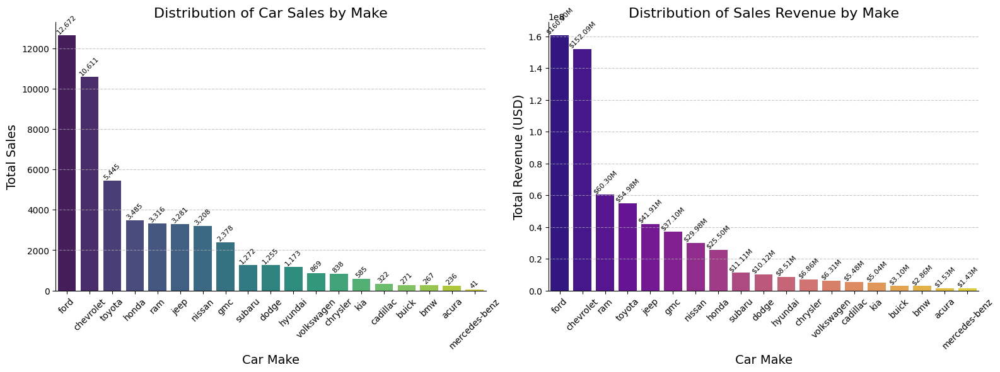

In [29]:
# Calculate total car sales by make
sales_by_make = df["make"].value_counts().reset_index()
sales_by_make.columns = ["make", "total_sales"]

# Calculate total sales revenue by make
revenue_by_make = df.groupby("make")["price"].sum().reset_index().sort_values(by="price", ascending=False)
revenue_by_make.columns = ["make", "total_revenue"]

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=False)

# Plot total car sales by make
sns.barplot(data=sales_by_make, x="make", y="total_sales", palette="viridis", ax=axes[0])
axes[0].set_title("Distribution of Car Sales by Make", fontsize=16)
axes[0].set_xlabel("Car Make", fontsize=14)
axes[0].set_ylabel("Total Sales", fontsize=14)
axes[0].tick_params(axis="x", rotation=45)
# Add labels
for bar, value in zip(axes[0].patches, sales_by_make["total_sales"]):
    axes[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.1, f"{int(value):,}",
                 ha="center", va="bottom", fontsize=8, rotation=45)

# Plot total sales revenue by make
sns.barplot(data=revenue_by_make, x="make", y="total_revenue", palette="plasma", ax=axes[1])
axes[1].set_title("Distribution of Sales Revenue by Make", fontsize=16)
axes[1].set_xlabel("Car Make", fontsize=14)
axes[1].set_ylabel("Total Revenue (USD)", fontsize=14)
axes[1].tick_params(axis="x", rotation=45)

# Add bar labels with values in millions
for bar, value in zip(axes[1].patches, revenue_by_make["total_revenue"]):
    axes[1].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1000, f"${bar.get_height() / 1e6:.2f}M",
                 ha="center", va="bottom", fontsize=8, rotation=45)
    
# Remove spines (outline box)
axes[0].spines["top"].set_visible(False)
axes[0].spines["right"].set_visible(False)
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

axes[1].spines["top"].set_visible(False)
axes[1].spines["right"].set_visible(False)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout
plt.tight_layout()
plt.show()

**Insight**: 
- *Ford* car brand appears to be the most sold vehicle brand in volume and also making the highest sales revenue for the car dealership.

#### - Distribution of Car Brand - Average Pricing

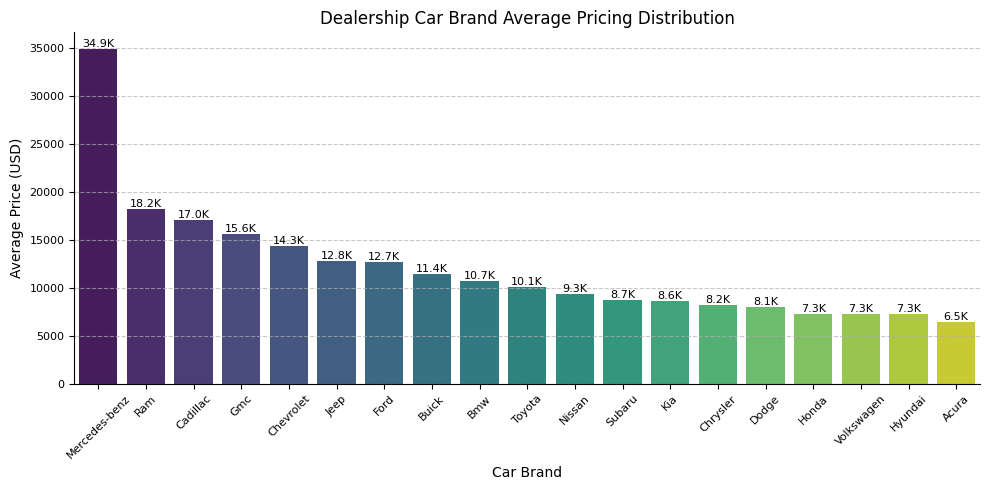

In [33]:
# Calculate the average price by make and sort from highest to lowest
avg_price_by_make = df.groupby("make")["price"].mean().reset_index().sort_values(by="price", ascending=False)

# Capitalize the first letter of each "make" for x-axis labels
avg_price_by_make["make"] = avg_price_by_make["make"].str.capitalize()

# Create the bar plot
plt.figure(figsize=(10, 5))
sns.barplot(data=avg_price_by_make, x="make", hue="make", y="price", dodge=False, palette="viridis")

# Customize the plot
plt.title("Dealership Car Brand Average Pricing Distribution", fontsize=12)
plt.xlabel("Car Brand", fontsize=10)
plt.ylabel("Average Price (USD)", fontsize=10)
plt.xticks(fontsize=8, rotation=45)  # Adjust x-axis tick label font size
plt.yticks(fontsize=8)  # Adjust y-axis tick label font size
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.grid(axis='y', linestyle='--', alpha=0.7)


# Add labels
for bar, value in zip(plt.gca().patches, avg_price_by_make["price"]):
    plt.gca().text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.1, f"{value / 1e3:.1f}K",
                 ha="center", va="bottom", fontsize=8)

# Display the plot
plt.tight_layout()
plt.show()

**Insight**:
- At an average pricing benchmark, Mercedez Benz car brand would appear to be the brand with the highest average sale price.
- Acura car brand appears to have the least sale price at an average.

#### - Average Price and Total Sales by Fuel Type:

C:\Users\felli\AppData\Local\Temp\ipykernel_84784\3095501691.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_price_by_fuel, x="fuel", y="average_price", palette="viridis", ax=axes[0])
C:\Users\felli\AppData\Local\Temp\ipykernel_84784\3095501691.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=total_sales_by_fuel, x="fuel", y="total_sales", palette="plasma", ax=axes[1])


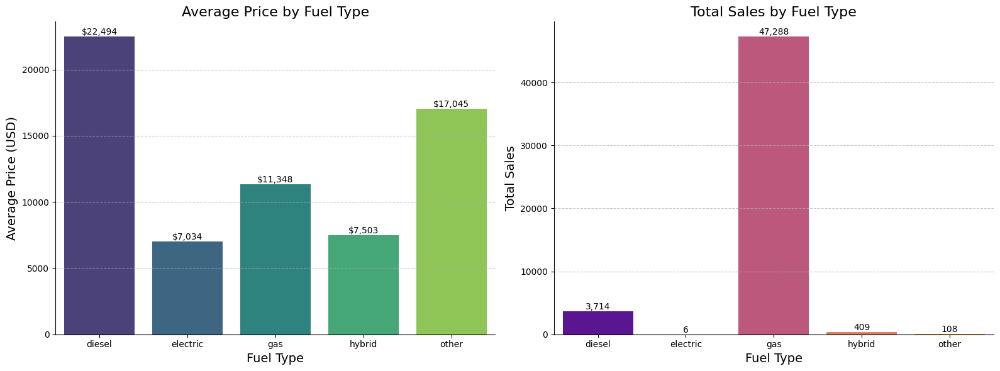

In [23]:
# Calculate average price and total sales by fuel type
avg_price_by_fuel = df.groupby("fuel")["price"].mean().reset_index().rename(columns={"price": "average_price"})
total_sales_by_fuel = df.groupby("fuel")["price"].count().reset_index().rename(columns={"price": "total_sales"})

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Average Price by Fuel Type
sns.barplot(data=avg_price_by_fuel, x="fuel", y="average_price", palette="viridis", ax=axes[0])
axes[0].set_title("Average Price by Fuel Type", fontsize=16)
axes[0].set_xlabel("Fuel Type", fontsize=14)
axes[0].set_ylabel("Average Price (USD)", fontsize=14)
axes[0].tick_params(axis="x")
axes[0].spines["top"].set_visible(False)
axes[0].spines["right"].set_visible(False)
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# Add labels
for bar, value in zip(axes[0].patches, avg_price_by_fuel["average_price"]):
    axes[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.1, f"${value:,.0f}",
                 ha="center", va="bottom", fontsize=10)

# Total Sales by Fuel Type
sns.barplot(data=total_sales_by_fuel, x="fuel", y="total_sales", palette="plasma", ax=axes[1])
axes[1].set_title("Total Sales by Fuel Type", fontsize=16)
axes[1].set_xlabel("Fuel Type", fontsize=14)
axes[1].set_ylabel("Total Sales", fontsize=14)
axes[1].tick_params(axis="x")
axes[1].spines["top"].set_visible(False)
axes[1].spines["right"].set_visible(False)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

# Add labels
for bar, value in zip(axes[1].patches, total_sales_by_fuel["total_sales"]):
    axes[1].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.1, f"{value:,.0f}",
                 ha="center", va="bottom", fontsize=10)

# Adjust layout
plt.tight_layout()
plt.show()

**Insight**:
- **Gas Fuel Type cars** are the **highest sold vehicles** with an average overall pricing of **$11,348**.
- **Diesel engine vehicles** generally have the **highest average sale price** at about **$22,000**.

#### - Fastest Selling Car Brand

C:\Users\felli\AppData\Local\Temp\ipykernel_84784\1730232114.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=fastest_selling_brands, x="make", y="days_listed", palette="coolwarm")


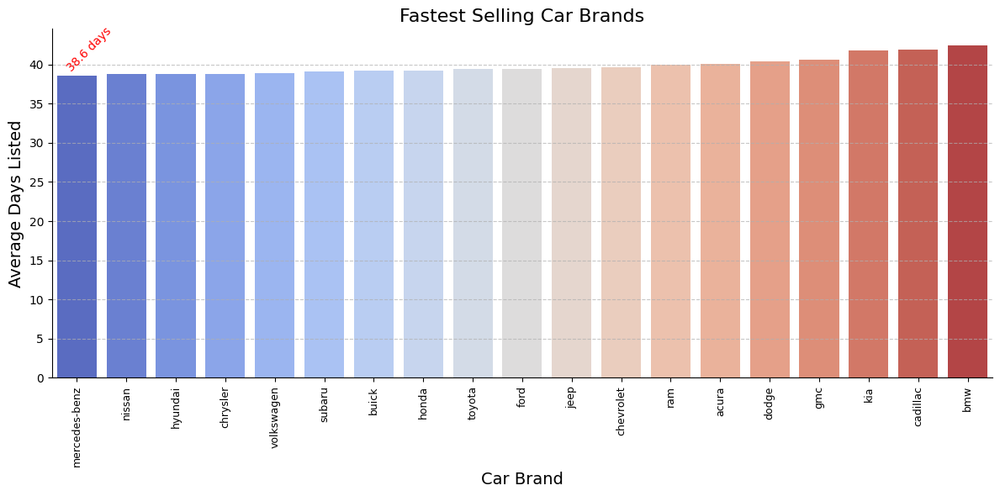

In [24]:
# Calculate the average number of days listed by brand
fastest_selling_brands = df.groupby("make")["days_listed"].mean().reset_index()
fastest_selling_brands = fastest_selling_brands.sort_values(by="days_listed")

# Create the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(data=fastest_selling_brands, x="make", y="days_listed", palette="coolwarm")

# Highlight the fastest selling brand
fastest_brand = fastest_selling_brands.iloc[0]
bar_x_position = fastest_selling_brands[fastest_selling_brands["make"] == fastest_brand["make"]].index[0]

# Highlight the fastest selling brand
fastest_brand = fastest_selling_brands.iloc[0]
plt.text(
    0.25,
    fastest_brand["days_listed"] + 0.5,
    f"{fastest_brand['days_listed']:.1f} days",
    ha="center",
    fontsize=10,
    color="red",
    rotation=45,
)

# Customize the plot
plt.title("Fastest Selling Car Brands", fontsize=16)
plt.xlabel("Car Brand", fontsize=14)
plt.ylabel("Average Days Listed", fontsize=14)
plt.xticks(fontsize=9, rotation=90)
plt.yticks(fontsize=10)
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.grid(axis='y', linestyle='--', alpha=0.7)



# Adjust layout and display
plt.tight_layout()
plt.show()

**Insight**:
- **Mercedes-Benz** appears as the fastest selling brand of car, at an average of 38.6 listing days.

#### - Sales by Model Year Decade Range:

C:\Users\felli\AppData\Local\Temp\ipykernel_33692\2710070161.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_price_by_decade = df.groupby("model_year_range")["price"].median().reset_index()
C:\Users\felli\AppData\Local\Temp\ipykernel_33692\2710070161.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=median_price_by_decade, x="model_year_range", y="median_price", palette="viridis", ax=axes[0])
C:\Users\felli\AppData\Local\Temp\ipykernel_33692\2710070161.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same 

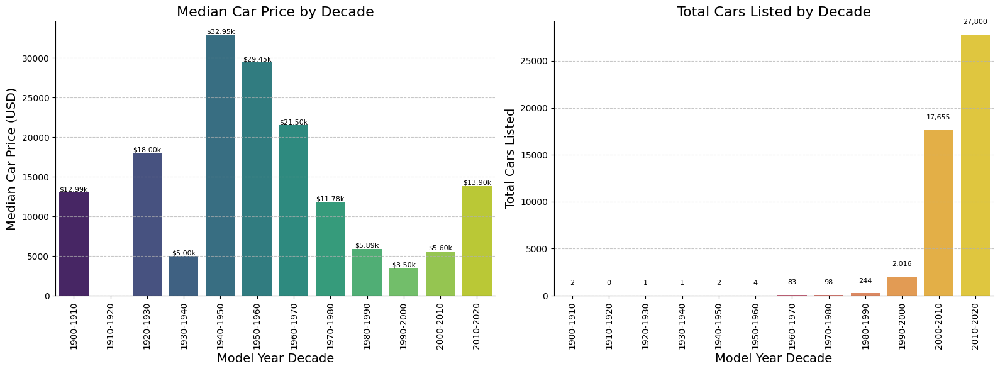

In [35]:
# Create a new column for the decade range
#df["decade"] = (df["model_year"] // 10 * 10).astype(str) + "s"

bins = [1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990, 2000, 2010, 2020]
labels = ["1900-1910", "1910-1920", "1920-1930", "1930-1940", "1940-1950", "1950-1960", "1960-1970", "1970-1980", "1980-1990", "1990-2000", "2000-2010", "2010-2020"]
df["model_year_range"] = pd.cut(df["model_year"], bins=bins, labels=labels, right=False)

# Calculate median price by decade
median_price_by_decade = df.groupby("model_year_range")["price"].median().reset_index()
median_price_by_decade.columns = ["model_year_range", "median_price"]

# Calculate total cars listed by decade
total_cars_by_decade = df["model_year_range"].value_counts().reset_index()
total_cars_by_decade.columns = ["model_year_range", "total_cars"]
total_cars_by_decade = total_cars_by_decade.sort_values(by="model_year_range")

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=False)

# Plot average price by decade
sns.barplot(data=median_price_by_decade, x="model_year_range", y="median_price", palette="viridis", ax=axes[0])
axes[0].set_title("Median Car Price by Decade", fontsize=16)
axes[0].set_xlabel("Model Year Decade", fontsize=14)
axes[0].set_ylabel("Median Car Price (USD)", fontsize=14)
axes[0].tick_params(axis="x", rotation=90)
axes[0].spines["top"].set_visible(False)
axes[0].spines["right"].set_visible(False)
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# Add labels
for bar, value in zip(axes[0].patches, median_price_by_decade["median_price"]):
    axes[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.1, f"${bar.get_height() / 1e3:.2f}k",
                 ha="center", va="bottom", fontsize=8)



# Plot total cars listed by decade
sns.barplot(data=total_cars_by_decade, x="model_year_range", y="total_cars", palette="plasma", ax=axes[1])
axes[1].set_title("Total Cars Listed by Decade", fontsize=16)
axes[1].set_xlabel("Model Year Decade", fontsize=14)
axes[1].set_ylabel("Total Cars Listed", fontsize=14)
axes[1].tick_params(axis="x", rotation=90)
axes[1].spines["top"].set_visible(False)
axes[1].spines["right"].set_visible(False)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

# Add bar labels with values in millions
for bar, value in zip(axes[1].patches, total_cars_by_decade["total_cars"]):
    axes[1].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1000, f"{int(value):,}",
                 ha="center", va="bottom", fontsize=8)

# Adjust layout
plt.tight_layout()
plt.show()

C:\Users\felli\AppData\Local\Temp\ipykernel_84784\3370948991.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_price_by_decade = df.groupby("model_year_range")["price"].sum().reset_index()
C:\Users\felli\AppData\Local\Temp\ipykernel_84784\3370948991.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=total_price_by_decade, x="model_year_range", y="total_price", palette="viridis")


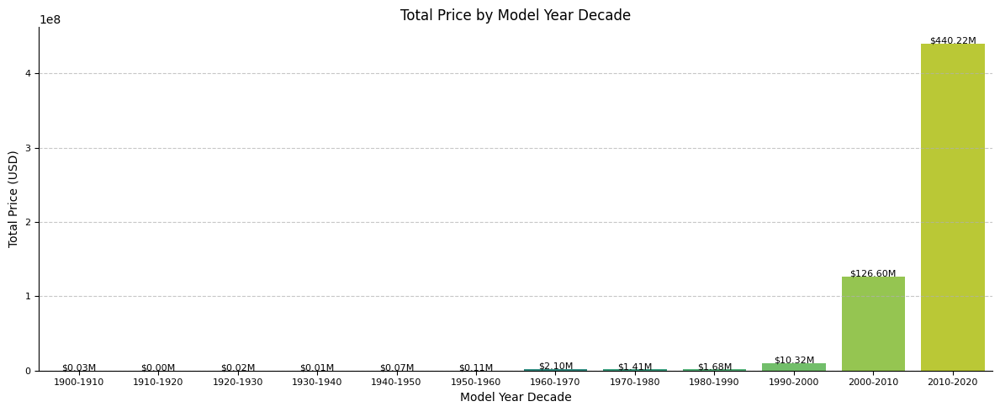

In [26]:
# Create a new column for decades
#df["decade"] = (df["model_year"] // 10) * 10  # Group by decades (e.g., 2010, 2000)

bins = [1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990, 2000, 2010, 2020]
labels = ["1900-1910", "1910-1920", "1920-1930", "1930-1940", "1940-1950", "1950-1960", "1960-1970", "1970-1980", "1980-1990", "1990-2000", "2000-2010", "2010-2020"]
df["model_year_range"] = pd.cut(df["model_year"], bins=bins, labels=labels, right=False)

# Calculate total price by decade
total_price_by_decade = df.groupby("model_year_range")["price"].sum().reset_index()
total_price_by_decade.columns = ["model_year_range", "total_price"]

# Create a bar plot
plt.figure(figsize=(12, 5))
sns.barplot(data=total_price_by_decade, x="model_year_range", y="total_price", palette="viridis")

# Customize the plot
plt.title("Total Price by Model Year Decade", fontsize=12)
plt.xlabel("Model Year Decade", fontsize=10)
plt.ylabel("Total Price (USD)", fontsize=10)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add bar labels
for bar, value in zip(plt.gca().patches, total_price_by_decade["total_price"]):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 1000,
        f"${value /1e6:,.2f}M",
        ha="center",
        fontsize=8
    )

    
# Show the plot
plt.tight_layout()
plt.show()

Based on visualization, it appears most of the sales revenue is from year 2000. Let's run a summary to see the stats prior to and from year 2000.

In [27]:
# Categorize data into "Before 2000" and "After 2000"
df["sales_period"] = ["Before 2000" if year < 2000 else "After 2000" for year in df["model_year"]]

# Calculate total sales (count) and total sales price
summary = df.groupby("sales_period").agg(
    total_sales=("price", "count"),
    total_sales_price=("price", "sum")
).reset_index()

# Calculate percentage shares
total_sales = summary["total_sales"].sum()
total_sales_price = summary["total_sales_price"].sum()
summary["sales_percentage"] = (summary["total_sales"] / total_sales) * 100
summary["price_percentage"] = (summary["total_sales_price"] / total_sales_price) * 100

# Format percentage to 2 decimal places and add commas for thousands
summary["sales_percentage"] = summary["sales_percentage"].apply(lambda x: f"{x:.2f}%")
summary["price_percentage"] = summary["price_percentage"].apply(lambda x: f"{x:.2f}%")
summary["total_sales_price"] = summary["total_sales_price"].apply(lambda x: f"${x:,.0f}")
summary["total_sales"] = summary["total_sales"].apply(lambda x: f"{x:,}")

# Display the summary
summary

,sales_period,total_sales,total_sales_price,sales_percentage,price_percentage
0,After 2000,"49,074","$609,386,640",95.24%,97.48%
1,Before 2000,"2,451","$15,738,615",4.76%,2.52%


**Insight**:
- Vintage vehicles (older vehicles pre-dating 1980s) tend to be higher priced. However, these set of vehicles are not typically in high demand.
- Sales revenue is heavily driven by car models from the 2000s and above, catering to more than 95% of sales revenue.

### B. Scatterplot

#### - Price vs. Odometer:

In [28]:
import plotly.express as px
fig = px.scatter(df, x="odometer", y="price", color="fuel", hover_data=["model", "model_year"])

# Create a scatter plot
fig = px.scatter(
    df,
    x="odometer",
    y="price",
    color="fuel",
    hover_data=["model", "model_year"],  # Additional data to show on hover
    title="Scatter Plot Distribution of Odometer reading by Vehicle Price Segmented by Fuel type"
)


# Update y-axis for specific formatting
fig.update_yaxes(
    tickprefix="$",  # Add a dollar sign prefix
    showgrid=True,   # Optional: Show grid lines
    title_font=dict(size=12),  # Customize y-axis label font
    title_text="Price (USD)",  # Set y-axis label
)
# Update y-axis for specific formatting
fig.update_xaxes(
    showgrid=True,   # Optional: Show grid lines
    title_font=dict(size=12),  # Customize y-axis label font
    title_text="Odometer (Miles)",  # Set y-axis label
)

fig.show()


**Insight**: 
- A positive correlation between a vehicle’s odometer reading and its price, segmented by fuel type.

#### - Days Listed vs. Price:

In [29]:
fig = px.scatter(df, x="days_listed", y="price", color="condition", hover_data=["model", "paint_color"])
fig.show()


**Insight**:
- Positive correlation between pricing and days listed, indicating that pricing tends to be a factor in determining how long a vehicle may be listed for.
- There are outlier situations though, where higher priced vehicles do not have long listing days, and where lower priced vehicles have very long listing days. Condition of the vehicle may be considered to be the determinant for such outliers.

#### - Days Listed vs Odometer by Condition

In [30]:
# Create a scatter plot segmented by condition
fig = px.scatter(
    df,
    x="odometer",
    y="days_listed",
    color="condition",
    title="Odometer vs. Days Listed by Condition",
    labels={"odometer": "Odometer (miles)", "days_listed": "Days Listed"},
    hover_data=["condition"],  # Additional details on hover
)

# Show the plot
fig.show()

**Insight**:
- Positive correlation observed between odometer and days listed. The lower the odometer, the lower the days a vehicle stays listed for sale. 
- By condition, the newer the vehicles would definitely have close to zero odometer reading, which would invariably imply lower number of days listed for sale. The condition of vehicle likewise has positive correlation with days listed.

### C. Histogram

#### - Price Distribution:

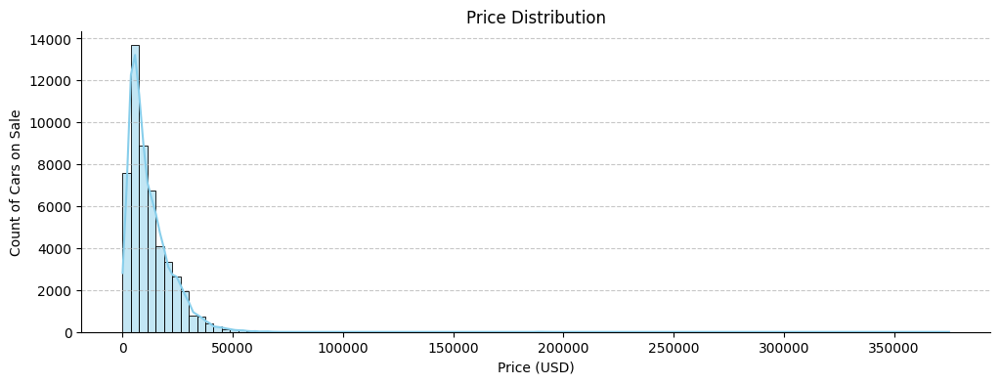

In [31]:
plt.figure(figsize=(12, 4))
sns.histplot(df["price"], bins=100, kde=True, color="skyblue")
plt.title("Price Distribution")
plt.xlabel("Price (USD)", fontsize=10)
plt.ylabel("Count of Cars on Sale", fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)

plt.show()



**Insight**: Understand the spread and central tendency of car prices.
- The largest spread of vehicles on sale and sold are less than $50,000.

#### - Days Listing Spread and Central Tendency

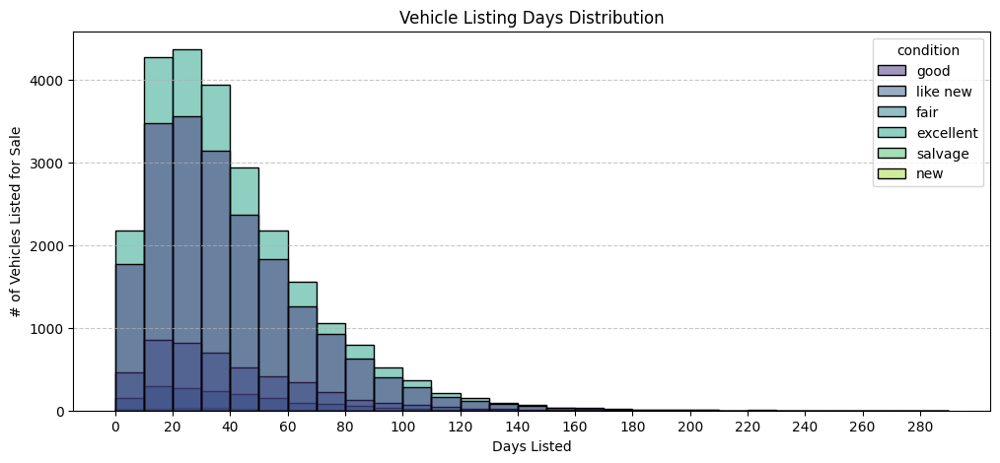

In [32]:
# Plot the distribution using seaborn
plt.figure(figsize=(12, 5))
sns.histplot(data=df, x='days_listed', hue="condition", bins=np.arange(0, 300, 10), palette='viridis')

plt.title('Vehicle Listing Days Distribution')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(np.arange(0, 300, 20))
plt.xlabel('Days Listed')
plt.ylabel('# of Vehicles Listed for Sale')


plt.show()

#### - Odometer Distribution:

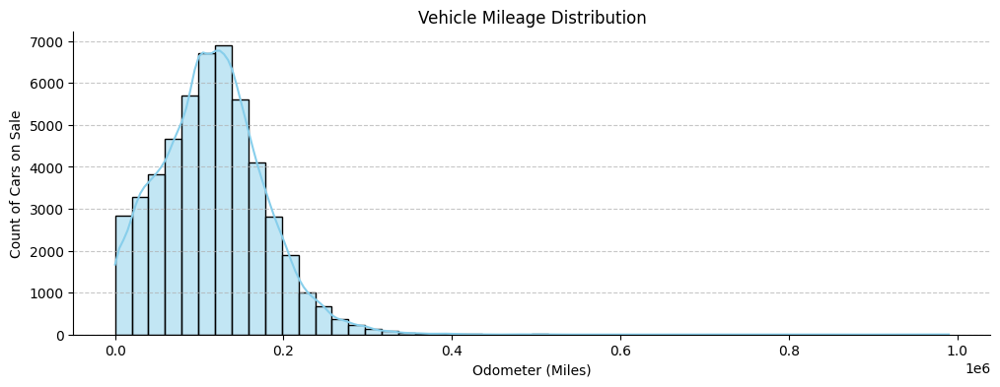

In [33]:
plt.figure(figsize=(12, 4))
sns.histplot(df["odometer"], bins=50, kde=True, element="bars", color="skyblue")
plt.title("Vehicle Mileage Distribution")
plt.xlabel("Odometer (Miles)", fontsize=10)
plt.ylabel("Count of Cars on Sale", fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)

plt.show()



**Insight**: 
- Mileage range for listed vehicles is largely within 200,000 miles.

### D. Line Plot

In [34]:
df["date_posted"] = pd.to_datetime(df["date_posted"])
listings_over_time = df.groupby("date_posted").size().reset_index(name="count")
fig = px.line(listings_over_time, x="date_posted", y="count", title="Number of Listings Over Time")
fig.show()


**Insight**: Observing how car listings fluctuate over time.
- No noticeable pattern to conclude that volume of listings having any correlation with time and seasons.

### E. Box Plot

#### - Price Distribution by Transmission Type:

In [35]:
fig = px.box(df, x="transmission", y="price", color="transmission", title="Price Distribution by Transmission Type")
fig.show()


**Insight**: 
- Comparison of he price distribution across different transmission types, shows that Automatic transmission vehicles has the most pricing outliers.


## 5. Conclusions

The visualizations and analyses derived from the dataset has revealed insights that can help the business optimize its strategies, target customer preferences effectively and improve inventory management.

- The impact of vehicle attributes - odometer, condition, fuel, transmission, type - on price and sales.
    - **Gas Fuel Type cars** are the **highest sold vehicles** with an average overall pricing of **$11,348**.
    - **Diesel engine vehicles** generally have the **highest average sale price** at about **$22,000**.
    - The largest spread of vehicles on sale and sold are less than $50,000.
    - Mileage range for listed vehicles is largely within 200,000 miles.
    - A positive correlation between a vehicle’s odometer reading and its price, segmented by fuel type.
    - Positive correlation between pricing and days listed, indicating that pricing tends to be a factor in determining how long a vehicle may be listed for.
    - There are outlier situations though, where higher priced vehicles do not have long listing days, and where lower priced vehicles have very long listing days. Condition of the vehicle may be considered to be the determinant for such outliers.
    - Positive correlation observed between odometer and days listed. The lower the odometer, the lower the days a vehicle stays listed for sale. 
    - By condition, the newer the vehicles would definitely have close to zero odometer reading, which would invariably imply lower number of days listed for sale. The condition of vehicle likewise has positive correlation with days listed.

- **Popular car brands and their market performance**:
    - **Mercedes-Benz** appears as the fastest selling brand of car, at an average of 38.6 listing days.
    - At an average pricing benchmark, Mercedez Benz car brand would appear to be the brand with the highest average sale price.
    - **Acura** car brand appears to have the least sale price.
    - **Ford** car brand appears to be the most sold vehicle brand in volume and also making the highest sales revenue for the car dealership.

- **Decade-wise trends in price and sales**:
    - Vintage vehicles (older vehicles pre-dating 1980s) tend to be higher priced. However, these set of vehicles are not typically in high demand.
    - Sales revenue is heavily driven by car models from the 2000s and above, catering to more than 95% of sales revenue.

This analysis, is meant to aid the business in making decisions on what to strategically focus on, depending on intended business objectives.






